In [ ]:
#13.2.1 오토인코더란

In [12]:
#다음은 한글깨짐을 해결하기 위해 설치합니다
#설치 후에는 런터임을 다시 시작합니다
#!sudo apt-get install -y fonts-nanum
#!sudo fc-cache -fv
#!rm ~/.cache/matplotlib -rf


Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 37 not upgraded.
Need to get 9,604 kB of archives.
After this operation, 29.5 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fonts-nanum all 20170925-1 [9,604 kB]
Fetched 9,604 kB in 2s (5,233 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package fonts-nanum.
(Reading database ... 155222 files and d

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.pylab as plt

import torchvision.datasets as datasets
import torchvision.transforms as transforms

import matplotlib.pyplot as plt
plt.rc('font', family='NanumBarunGothic') 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [2]:
from google.colab import files # 데이터 불러오기
file_uploaded=files.upload()   # chap13/data.zip 데이터 불러오기

Saving data.zip to data.zip


In [3]:
!unzip data.zip -d data/  #data 폴더 만들어 압축 풀기

Archive:  data.zip
  inflating: data/MNIST/processed/test.pt  
  inflating: data/MNIST/processed/training.pt  
  inflating: data/MNIST/raw/t10k-images-idx3-ubyte  
 extracting: data/MNIST/raw/t10k-images-idx3-ubyte.gz  
  inflating: data/MNIST/raw/t10k-labels-idx1-ubyte  
 extracting: data/MNIST/raw/t10k-labels-idx1-ubyte.gz  
  inflating: data/MNIST/raw/train-images-idx3-ubyte  
 extracting: data/MNIST/raw/train-images-idx3-ubyte.gz  
  inflating: data/MNIST/raw/train-labels-idx1-ubyte  
 extracting: data/MNIST/raw/train-labels-idx1-ubyte.gz  
replace data/MNIST? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
error:  cannot delete old data/MNIST
        Is a directory


In [2]:
transform = transforms.Compose([transforms.ToTensor()])

train_dataset = datasets.MNIST(
    root="./data", train=True, transform=transform, download=True)

test_dataset = datasets.MNIST(
    root="./data", train=False, transform=transform, download=True)

train_loader = DataLoader(
    train_dataset, batch_size=128, shuffle=True, num_workers=4, pin_memory=False)

test_loader = DataLoader(
    test_dataset, batch_size=32, shuffle=False, num_workers=4)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [3]:
class Encoder(nn.Module):    
    def __init__(self, encoded_space_dim,fc2_input_dim):
        super().__init__()
        
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(1, 8, 3, stride=2, padding=1),
            nn.ReLU(True),
            nn.Conv2d(8, 16, 3, stride=2, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.Conv2d(16, 32, 3, stride=2, padding=0),
            nn.ReLU(True)
        )
        
        self.flatten = nn.Flatten(start_dim=1)
        self.encoder_lin = nn.Sequential(
            nn.Linear(3 * 3 * 32, 128),
            nn.ReLU(True),
            nn.Linear(128, encoded_space_dim)
        )
        
    def forward(self, x):
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        x = self.encoder_lin(x)
        return x
    
class Decoder(nn.Module):    
    def __init__(self, encoded_space_dim,fc2_input_dim):
        super().__init__()
        self.decoder_lin = nn.Sequential(
            nn.Linear(encoded_space_dim, 128),
            nn.ReLU(True),
            nn.Linear(128, 3 * 3 * 32),
            nn.ReLU(True)
        )

        self.unflatten = nn.Unflatten(dim=1, 
        unflattened_size=(32, 3, 3))

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 3, 
            stride=2, output_padding=0),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 3, stride=2, 
            padding=1, output_padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 1, 3, stride=2, 
            padding=1, output_padding=1)
        )
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

In [4]:
encoder = Encoder(encoded_space_dim=4,fc2_input_dim=128)
decoder = Decoder(encoded_space_dim=4,fc2_input_dim=128)
encoder.to(device)
decoder.to(device)

params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=0.001, weight_decay=1e-05)
loss_fn = torch.nn.MSELoss()

In [5]:
def train_epoch(encoder, decoder, device, dataloader, loss_fn, optimizer,noise_factor=0.3):
    encoder.train()
    decoder.train()
    train_loss = []
    for image_batch, _ in dataloader: 
        image_noisy = add_noise(image_batch,noise_factor)
        image_noisy = image_noisy.to(device)    
        encoded_data = encoder(image_noisy)
        decoded_data = decoder(encoded_data)
        loss = loss_fn(decoded_data, image_noisy)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss.append(loss.detach().cpu().numpy())
    return np.mean(train_loss)

In [6]:
def test_epoch(encoder, decoder, device, dataloader, loss_fn,noise_factor=0.3):
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): 
        conc_out = []
        conc_label = []
        for image_batch, _ in dataloader:
            image_batch = image_batch.to(device)
            encoded_data = encoder(image_batch)
            decoded_data = decoder(encoded_data)
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

In [7]:
def add_noise(inputs,noise_factor=0.3):
    noisy = inputs+torch.randn_like(inputs) * noise_factor
    noisy = torch.clip(noisy,0.,1.)
    return noisy

In [8]:
def plot_ae_outputs(encoder,decoder,n=5,noise_factor=0.3):
    plt.figure(figsize=(10,4.5))
    for i in range(n):
        ax = plt.subplot(3,n,i+1)
        img = test_dataset[i][0].unsqueeze(0)
        image_noisy = add_noise(img,noise_factor)     
        image_noisy = image_noisy.to(device)

        encoder.eval()
        decoder.eval()

        with torch.no_grad():
            rec_img  = decoder(encoder(image_noisy))

        plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('원래 이미지')
        ax = plt.subplot(3, n, i + 1 + n)
        plt.imshow(image_noisy.cpu().squeeze().numpy(), cmap='gist_gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('노이즈가 적용되어 손상된 이미지')

        ax = plt.subplot(3, n, i + 1 + n + n)
        plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('재구성된 이미지')
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.7, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.3)     
    plt.show() 

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



 EPOCH 1/30 	 train loss 0.074 	 val loss 0.050


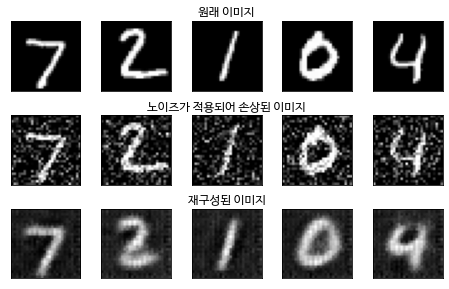


 EPOCH 2/30 	 train loss 0.055 	 val loss 0.045


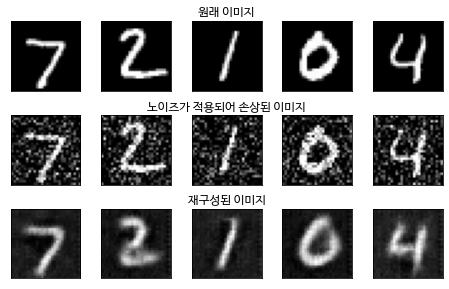


 EPOCH 3/30 	 train loss 0.053 	 val loss 0.042


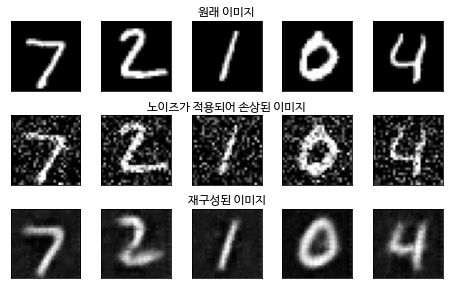


 EPOCH 4/30 	 train loss 0.052 	 val loss 0.041


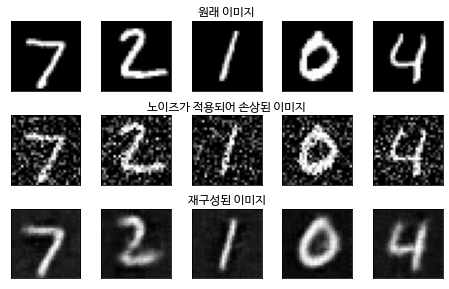


 EPOCH 5/30 	 train loss 0.052 	 val loss 0.041


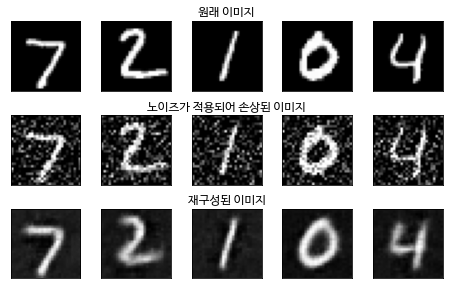


 EPOCH 6/30 	 train loss 0.051 	 val loss 0.040


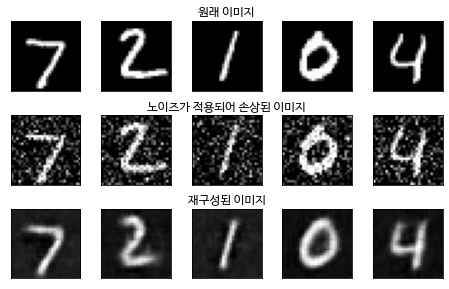


 EPOCH 7/30 	 train loss 0.051 	 val loss 0.040


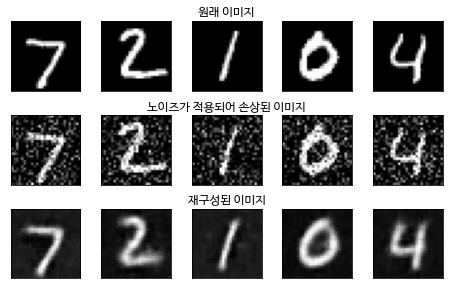


 EPOCH 8/30 	 train loss 0.051 	 val loss 0.040


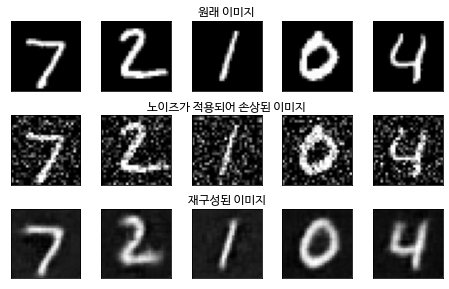


 EPOCH 9/30 	 train loss 0.051 	 val loss 0.040


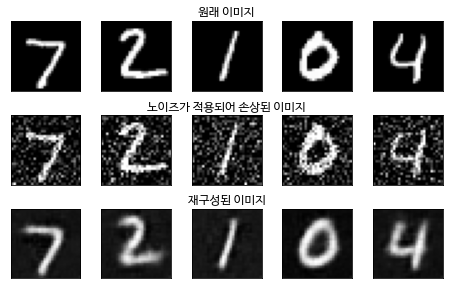


 EPOCH 10/30 	 train loss 0.051 	 val loss 0.040


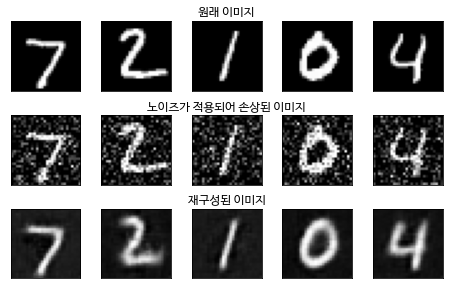


 EPOCH 11/30 	 train loss 0.050 	 val loss 0.040


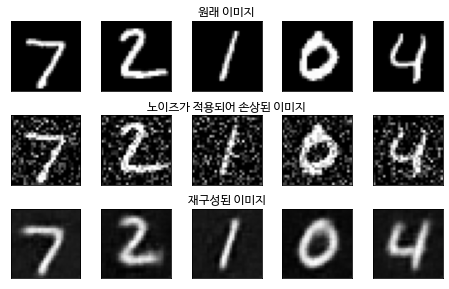


 EPOCH 12/30 	 train loss 0.050 	 val loss 0.039


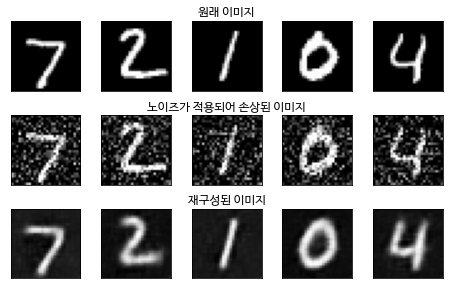


 EPOCH 13/30 	 train loss 0.050 	 val loss 0.039


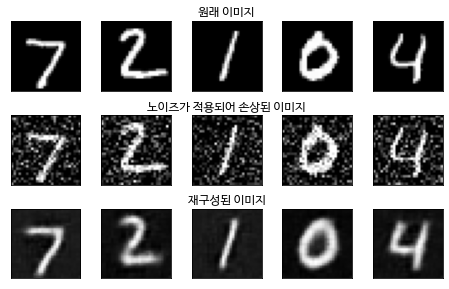


 EPOCH 14/30 	 train loss 0.050 	 val loss 0.039


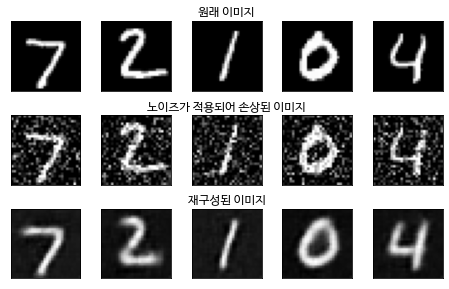


 EPOCH 15/30 	 train loss 0.050 	 val loss 0.039


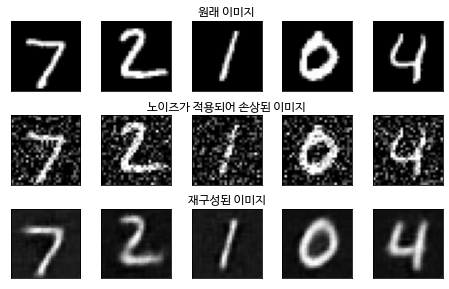


 EPOCH 16/30 	 train loss 0.050 	 val loss 0.039


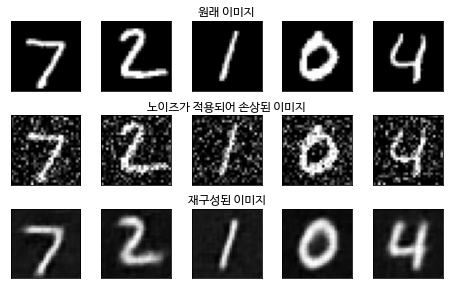


 EPOCH 17/30 	 train loss 0.050 	 val loss 0.039


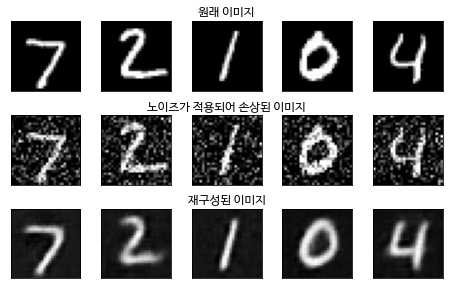


 EPOCH 18/30 	 train loss 0.050 	 val loss 0.039


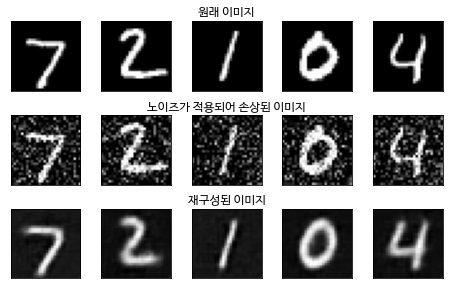


 EPOCH 19/30 	 train loss 0.050 	 val loss 0.038


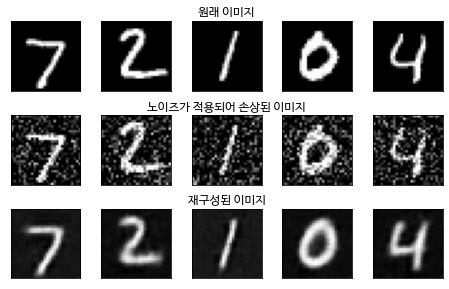


 EPOCH 20/30 	 train loss 0.050 	 val loss 0.039


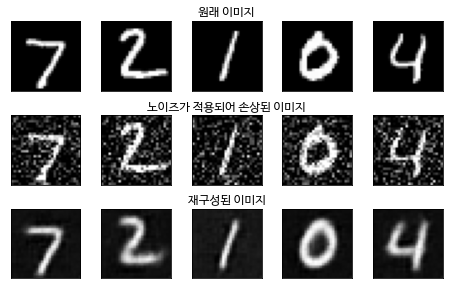


 EPOCH 21/30 	 train loss 0.050 	 val loss 0.038


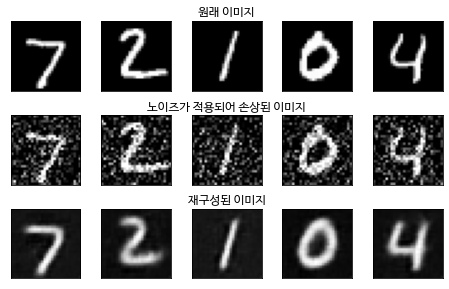


 EPOCH 22/30 	 train loss 0.050 	 val loss 0.038


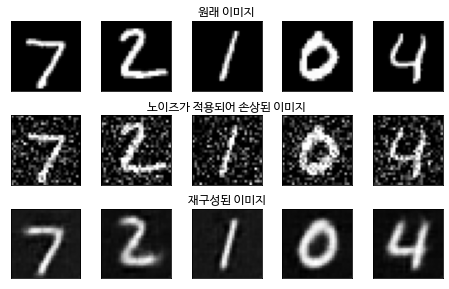


 EPOCH 23/30 	 train loss 0.050 	 val loss 0.038


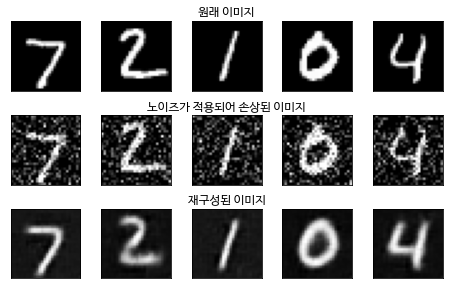


 EPOCH 24/30 	 train loss 0.050 	 val loss 0.038


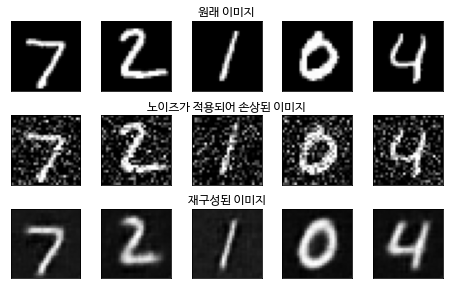


 EPOCH 25/30 	 train loss 0.050 	 val loss 0.038


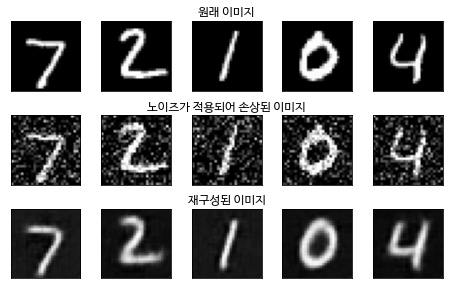


 EPOCH 26/30 	 train loss 0.050 	 val loss 0.038


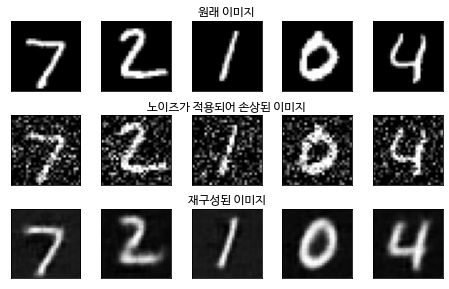


 EPOCH 27/30 	 train loss 0.050 	 val loss 0.038


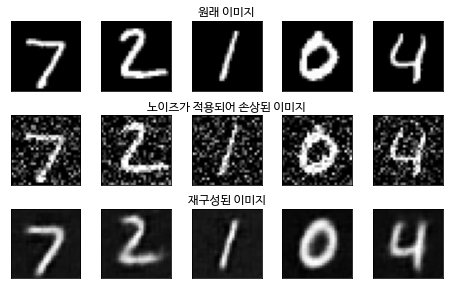


 EPOCH 28/30 	 train loss 0.050 	 val loss 0.038


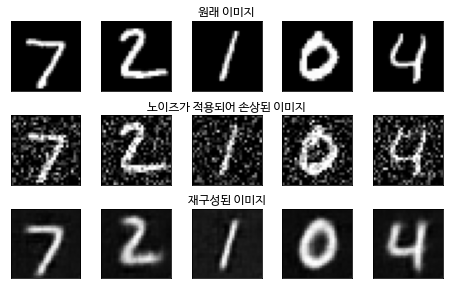


 EPOCH 29/30 	 train loss 0.050 	 val loss 0.038


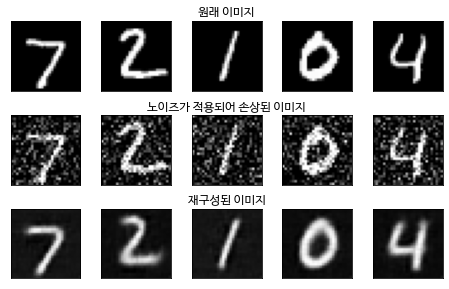


 EPOCH 30/30 	 train loss 0.049 	 val loss 0.038


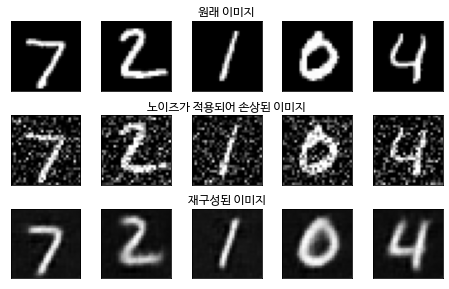

In [9]:
import numpy as np

num_epochs = 30
history_da={'train_loss':[],'val_loss':[]}
loss_fn = torch.nn.MSELoss()

for epoch in range(num_epochs):
    train_loss=train_epoch(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=train_loader, 
        loss_fn=loss_fn, 
        optimizer=optim, noise_factor=0.3)
    val_loss = test_epoch(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=test_loader, 
        loss_fn=loss_fn, noise_factor=0.3)
    history_da['train_loss'].append(train_loss)
    history_da['val_loss'].append(val_loss)
    print('\n EPOCH {}/{} \t train loss {:.3f} \t val loss {:.3f}'.format(epoch + 1, num_epochs,train_loss,val_loss))
    plot_ae_outputs(encoder,decoder,noise_factor=0.3)

In [ ]:
#13.2.2 변형 오토인코더(Variational AutoEncoder)

In [10]:
!pip install tensorboardX

     |████████████████████████████████| 124 kB 7.7 MB/s 


In [11]:
import datetime
import os
from tensorboardX import SummaryWriter

import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.pylab as plt

import torchvision.datasets as datasets
import torchvision.transforms as transforms

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [12]:
transform = transforms.Compose([transforms.ToTensor()])

train_dataset = datasets.MNIST(
    root="/data", train=True, transform=transform, download=True)

test_dataset = datasets.MNIST(
    root="/data", train=False, transform=transform, download=True)

train_loader = DataLoader(
    train_dataset, batch_size=100, shuffle=True, num_workers=4, pin_memory=False)

test_loader = DataLoader(
    test_dataset, batch_size=100, shuffle=False, num_workers=4)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting /data/MNIST/raw/train-images-idx3-ubyte.gz to /data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting /data/MNIST/raw/train-labels-idx1-ubyte.gz to /data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting /data/MNIST/raw/t10k-images-idx3-ubyte.gz to /data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting /data/MNIST/raw/t10k-labels-idx1-ubyte.gz to /data/MNIST/raw



/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [13]:
class Encoder(nn.Module):    
    def __init__(self, input_dim, hidden_dim, latent_dim):
        super(Encoder, self).__init__()
        self.input1 = nn.Linear(input_dim, hidden_dim)
        self.input2 = nn.Linear(hidden_dim, hidden_dim)
        self.mean = nn.Linear(hidden_dim, latent_dim)
        self.var = nn.Linear (hidden_dim, latent_dim)
        
        self.LeakyReLU = nn.LeakyReLU(0.2)        
        self.training = True
        
    def forward(self, x):
        h_ = self.LeakyReLU(self.input1(x))
        h_ = self.LeakyReLU(self.input2(h_))
        mean = self.mean(h_)
        log_var = self.var(h_)                           
        return mean, log_var

In [14]:
class Decoder(nn.Module):
    def __init__(self, latent_dim, hidden_dim, output_dim):
        super(Decoder, self).__init__()
        self.hidden1 = nn.Linear(latent_dim, hidden_dim)
        self.hidden2 = nn.Linear(hidden_dim, hidden_dim)
        self.output = nn.Linear(hidden_dim, output_dim)        
        self.LeakyReLU = nn.LeakyReLU(0.2)
        
    def forward(self, x):
        h = self.LeakyReLU(self.hidden1(x))
        h = self.LeakyReLU(self.hidden2(h))        
        x_hat = torch.sigmoid(self.output(h))
        return x_hat

In [15]:
class Model(nn.Module):
    def __init__(self, Encoder, Decoder):
        super(Model, self).__init__()
        self.Encoder = Encoder
        self.Decoder = Decoder
        
    def reparameterization(self, mean, var):
        epsilon = torch.randn_like(var).to(device)                
        z = mean + var*epsilon                          
        return z
                        
    def forward(self, x):
        mean, log_var = self.Encoder(x)
        z = self.reparameterization(mean, torch.exp(0.5 * log_var)) 
        x_hat = self.Decoder(z)        
        return x_hat, mean, log_var

In [16]:
x_dim  = 784
hidden_dim = 400
latent_dim = 200
epochs = 30
batch_size = 100

encoder = Encoder(input_dim=x_dim, hidden_dim=hidden_dim, latent_dim=latent_dim)
decoder = Decoder(latent_dim=latent_dim, hidden_dim = hidden_dim, output_dim = x_dim)

model = Model(Encoder=encoder, Decoder=decoder).to(device)

In [17]:
def loss_function(x, x_hat, mean, log_var):
    reproduction_loss = nn.functional.binary_cross_entropy(x_hat, x, reduction='sum')
    KLD = - 0.5 * torch.sum(1+ log_var - mean.pow(2) - log_var.exp())
    return reproduction_loss, KLD

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

In [18]:
saved_loc = 'scalar/'
writer = SummaryWriter(saved_loc)

model.train()
def train(epoch, model, train_loader, optimizer):
    train_loss = 0
    for batch_idx, (x, _) in enumerate(train_loader):
        x = x.view(batch_size, x_dim)
        x = x.to(device)

        optimizer.zero_grad()
        x_hat, mean, log_var = model(x)
        BCE, KLD = loss_function(x, x_hat, mean, log_var)
        loss = BCE + KLD
        writer.add_scalar("Train/Reconstruction Error", BCE.item(), batch_idx + epoch * (len(train_loader.dataset)/batch_size) )
        writer.add_scalar("Train/KL-Divergence", KLD.item(), batch_idx + epoch * (len(train_loader.dataset)/batch_size) )
        writer.add_scalar("Train/Total Loss" , loss.item(), batch_idx + epoch * (len(train_loader.dataset)/batch_size) )
        
        train_loss += loss.item()  
        loss.backward()
        optimizer.step()
          
        if batch_idx % 100 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\t Loss: {:.6f}'.format(
                epoch, batch_idx * len(x), len(train_loader.dataset),
                100. * batch_idx / len(train_loader),
                loss.item() / len(x)))
            
    print("======> Epoch: {} Average loss: {:.4f}".format(
        epoch, train_loss / len(train_loader.dataset)))

In [19]:
def test(epoch, model, test_loader):
    model.eval()
    test_loss = 0
    with torch.no_grad():
        for batch_idx, (x, _) in enumerate(test_loader):
            x = x.view(batch_size, x_dim)
            x = x.to(device)        
            x_hat, mean, log_var = model(x)
            BCE, KLD = loss_function(x, x_hat, mean, log_var)
            loss = BCE + KLD
        
            writer.add_scalar("Test/Reconstruction Error", BCE.item(), batch_idx + epoch * (len(test_loader.dataset)/batch_size) )
            writer.add_scalar("Test/KL-Divergence", KLD.item(), batch_idx + epoch * (len(test_loader.dataset)/batch_size) )
            writer.add_scalar("Test/Total Loss" , loss.item(), batch_idx + epoch * (len(test_loader.dataset)/batch_size) )
            test_loss += loss.item()

            if batch_idx == 0:
                n = min(x.size(0), 8)
                comparison = torch.cat([x[:n], x_hat.view(batch_size, x_dim)[:n]])
                grid = torchvision.utils.make_grid(comparison.cpu()) 
                writer.add_image("Test image - Above: Real data, below: reconstruction data", grid, epoch)

In [20]:
from tqdm.auto import tqdm
for epoch in tqdm(range(0, epochs)):
    train(epoch, model, train_loader, optimizer)
    test(epoch, model, test_loader)
    print("\n")
writer.close()

  0%|          | 0/30 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Train Epoch: 0 [0/60000 (0%)]	 Loss: 546.047812
Train Epoch: 0 [10000/60000 (17%)]	 Loss: 198.497793
Train Epoch: 0 [20000/60000 (33%)]	 Loss: 184.993828
Train Epoch: 0 [30000/60000 (50%)]	 Loss: 170.591426
Train Epoch: 0 [40000/60000 (67%)]	 Loss: 151.067725
Train Epoch: 0 [50000/60000 (83%)]	 Loss: 151.784590
======> Epoch: 0 Average loss: 173.0574


Train Epoch: 1 [0/60000 (0%)]	 Loss: 135.950518
Train Epoch: 1 [10000/60000 (17%)]	 Loss: 135.465537
Train Epoch: 1 [20000/60000 (33%)]	 Loss: 140.292412
Train Epoch: 1 [30000/60000 (50%)]	 Loss: 132.748242
Train Epoch: 1 [40000/60000 (67%)]	 Loss: 120.301514
Train Epoch: 1 [50000/60000 (83%)]	 Loss: 127.726250
======> Epoch: 1 Average loss: 128.8850


Train Epoch: 2 [0/60000 (0%)]	 Loss: 116.395234
Train Epoch: 2 [10000/60000 (17%)]	 Loss: 121.413467
Train Epoch: 2 [20000/60000 (33%)]	 Loss: 114.031309
Train Epoch: 2 [30000/60000 (50%)]	 Loss: 112.669375
Train Epoch: 2 [40000/60000 (67%)]	 Loss: 118.487520
Train Epoch: 2 [50000/60000 (8

In [21]:
%load_ext tensorboard
%tensorboard --logdir scalar --port=6013

<IPython.core.display.Javascript object>

In [ ]:
#13.3.2 GAN 구현하기

In [22]:
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib
import matplotlib.pylab as plt

from torchvision.utils import make_grid, save_image
import torchvision.datasets as datasets
import torchvision.transforms as transforms
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [23]:
batch_size = 512
epochs = 200
sample_size = 64 
nz = 128 
k = 1 

In [24]:
transform = transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,),(0.5,)),
])

train_dataset = datasets.MNIST(
    root="./data", train=True, transform=transform, download=True)

train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [25]:
class Generator(nn.Module):
    def __init__(self, nz):
        super(Generator, self).__init__()
        self.nz = nz
        self.main = nn.Sequential(
            nn.Linear(self.nz, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 784),
            nn.Tanh(),
        )
    def forward(self, x):
        return self.main(x).view(-1, 1, 28, 28)

In [26]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.n_input = 784
        self.main = nn.Sequential(
            nn.Linear(self.n_input, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )
    def forward(self, x):
        x = x.view(-1, 784)
        return self.main(x)

In [27]:
generator = Generator(nz).to(device)
discriminator = Discriminator().to(device)
print(generator)
print(discriminator)

Generator(
  (main): Sequential(
    (0): Linear(in_features=128, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Linear(in_features=256, out_features=512, bias=True)
    (3): LeakyReLU(negative_slope=0.2)
    (4): Linear(in_features=512, out_features=1024, bias=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Linear(in_features=1024, out_features=784, bias=True)
    (7): Tanh()
  )
)
Discriminator(
  (main): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1024, out_features=512, bias=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Dropout(p=0.3, inplace=False)
    (6): Linear(in_features=512, out_features=256, bias=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Dropout(p=0.3, inplace=False)
    (9): Linear(in_features=256, out_features=1, bias=True)
    (10): Sigmoid()
  )
)


In [28]:
optim_g = optim.Adam(generator.parameters(), lr=0.0002)
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002)

criterion = nn.BCELoss()

losses_g = [] 
losses_d = [] 
images = [] 

In [29]:
def save_generator_image(image, path):
    save_image(image, path)

In [30]:
def train_discriminator(optimizer, data_real, data_fake):
    b_size = data_real.size(0)
    real_label = torch.ones(b_size, 1).to(device)
    fake_label = torch.zeros(b_size, 1).to(device)
    optimizer.zero_grad()
    output_real = discriminator(data_real)
    loss_real = criterion(output_real, real_label)
    output_fake = discriminator(data_fake)
    loss_fake = criterion(output_fake, fake_label)
    loss_real.backward()
    loss_fake.backward()
    optimizer.step()
    return loss_real + loss_fake

In [31]:
def train_generator(optimizer, data_fake):
    b_size = data_fake.size(0)    
    real_label = torch.ones(b_size, 1).to(device)
    optimizer.zero_grad()
    output = discriminator(data_fake)
    loss = criterion(output, real_label)
    loss.backward()
    optimizer.step()
    return loss

In [32]:
!mkdir img #img 폴더 만들기

In [33]:
generator.train()
discriminator.train()

for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for idx, data in tqdm(enumerate(train_loader), total=int(len(train_dataset)/train_loader.batch_size)):
        image, _ = data
        image = image.to(device)
        b_size = len(image)
        for step in range(k):                                
            data_fake = generator(torch.randn(b_size, nz).to(device)).detach()
            data_real = image
            loss_d += train_discriminator(optim_d, data_real, data_fake)
        data_fake = generator(torch.randn(b_size, nz).to(device))
        loss_g += train_generator(optim_g, data_fake)
    generated_img = generator(torch.randn(b_size, nz).to(device)).cpu().detach()
    generated_img = make_grid(generated_img)
    save_generator_image(generated_img, "./img/gen_img{epoch}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / idx 
    epoch_loss_d = loss_d / idx 
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)
    
    print(f"Epoch {epoch} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
118it [00:08, 13.93it/s]                         

Epoch 0 of 200
Generator loss: 1.57236302, Discriminator loss: 0.89125913



118it [00:08, 13.89it/s]                         

Epoch 1 of 200
Generator loss: 3.15326047, Discriminator loss: 1.16956282



118it [00:09, 12.50it/s]

Epoch 2 of 200
Generator loss: 6.33165121, Discriminator loss: 0.31884465



118it [00:08, 13.58it/s]                         


Epoch 3 of 200
Generator loss: 3.38645434, Discriminator loss: 0.98270249


118it [00:08, 13.61it/s]                         

Epoch 4 of 200
Generator loss: 1.18853605, Discriminator loss: 1.31240320



118it [00:08, 13.69it/s]                         

Epoch 5 of 200
Generator loss: 1.53267097, Discriminator loss: 1.04799771



118it [00:08, 14.50it/s]                         


Epoch 6 of 200
Generator loss: 1.22563124, Discriminator loss: 1.13328385


118it [00:08, 14.38it/s]                         

Epoch 7 of 200
Generator loss: 1.57630563, Discriminator loss: 0.98589355



118it [00:08, 13.40it/s]                         

Epoch 8 of 200
Generator loss: 1.43965149, Discriminator loss: 0.94439948



118it [00:08, 14.27it/s]                         

Epoch 9 of 200
Generator loss: 2.45909047, Discriminator loss: 0.78129721



118it [00:08, 14.16it/s]                         

Epoch 10 of 200
Generator loss: 3.30473328, Discriminator loss: 0.59176052



118it [00:08, 14.10it/s]                         

Epoch 11 of 200
Generator loss: 3.74421191, Discriminator loss: 0.64251417



118it [00:08, 13.78it/s]

Epoch 12 of 200
Generator loss: 2.16970658, Discriminator loss: 0.79294020



118it [00:08, 14.26it/s]                         

Epoch 13 of 200
Generator loss: 2.79078364, Discriminator loss: 0.50272781



118it [00:08, 14.03it/s]                         

Epoch 14 of 200
Generator loss: 3.67287350, Discriminator loss: 0.42254150



118it [00:08, 13.97it/s]


Epoch 15 of 200
Generator loss: 3.43394542, Discriminator loss: 0.57663983


118it [00:08, 14.18it/s]


Epoch 16 of 200
Generator loss: 3.20531583, Discriminator loss: 0.42115515


118it [00:08, 14.59it/s]                         

Epoch 17 of 200
Generator loss: 3.15068531, Discriminator loss: 0.63064551



118it [00:08, 14.40it/s]                         

Epoch 18 of 200
Generator loss: 2.64640212, Discriminator loss: 0.47744584



118it [00:08, 14.24it/s]                         

Epoch 19 of 200
Generator loss: 3.51104546, Discriminator loss: 0.39055112



118it [00:08, 14.52it/s]                         

Epoch 20 of 200
Generator loss: 2.61478806, Discriminator loss: 0.63820666



118it [00:08, 14.27it/s]                         

Epoch 21 of 200
Generator loss: 2.83824587, Discriminator loss: 0.56616062



118it [00:08, 14.31it/s]

Epoch 22 of 200
Generator loss: 3.01972747, Discriminator loss: 0.57891834



118it [00:08, 14.57it/s]                         

Epoch 23 of 200
Generator loss: 3.01894188, Discriminator loss: 0.48582482



118it [00:08, 14.52it/s]                         

Epoch 24 of 200
Generator loss: 2.96310234, Discriminator loss: 0.57271439



118it [00:08, 14.66it/s]                         

Epoch 25 of 200
Generator loss: 3.11748552, Discriminator loss: 0.52735579



118it [00:08, 14.52it/s]                         

Epoch 26 of 200
Generator loss: 3.20817137, Discriminator loss: 0.41411948



118it [00:08, 14.67it/s]                         

Epoch 27 of 200
Generator loss: 2.72696090, Discriminator loss: 0.60187584



118it [00:08, 14.50it/s]                         


Epoch 28 of 200
Generator loss: 3.24951887, Discriminator loss: 0.43010736


118it [00:08, 14.57it/s]                         

Epoch 29 of 200
Generator loss: 3.14850473, Discriminator loss: 0.47265753



118it [00:08, 14.46it/s]                         

Epoch 30 of 200
Generator loss: 3.12653089, Discriminator loss: 0.47473243



118it [00:08, 14.75it/s]                         

Epoch 31 of 200
Generator loss: 3.10683656, Discriminator loss: 0.52753776



118it [00:08, 14.67it/s]                         

Epoch 32 of 200
Generator loss: 2.96593904, Discriminator loss: 0.51083809



118it [00:07, 14.83it/s]                         

Epoch 33 of 200
Generator loss: 3.22682524, Discriminator loss: 0.41803643



118it [00:07, 14.77it/s]                         

Epoch 34 of 200
Generator loss: 3.18815541, Discriminator loss: 0.45550179



118it [00:07, 14.78it/s]


Epoch 35 of 200
Generator loss: 3.12297702, Discriminator loss: 0.52909654


118it [00:08, 14.66it/s]                         

Epoch 36 of 200
Generator loss: 3.32561350, Discriminator loss: 0.35454825



118it [00:08, 14.62it/s]                         

Epoch 37 of 200
Generator loss: 4.06234789, Discriminator loss: 0.35242903



118it [00:07, 14.83it/s]                         

Epoch 38 of 200
Generator loss: 3.71973562, Discriminator loss: 0.40400869



118it [00:08, 14.61it/s]                         

Epoch 39 of 200
Generator loss: 3.44749856, Discriminator loss: 0.46620905



118it [00:07, 14.78it/s]                         


Epoch 40 of 200
Generator loss: 3.10337758, Discriminator loss: 0.49460033


118it [00:07, 14.75it/s]                         

Epoch 41 of 200
Generator loss: 3.12076640, Discriminator loss: 0.47391823



118it [00:08, 14.74it/s]                         

Epoch 42 of 200
Generator loss: 3.26458764, Discriminator loss: 0.43196431



118it [00:08, 14.60it/s]                         

Epoch 43 of 200
Generator loss: 3.20650673, Discriminator loss: 0.49979314



118it [00:08, 14.69it/s]                         

Epoch 44 of 200
Generator loss: 3.19796348, Discriminator loss: 0.48344293



118it [00:08, 14.75it/s]                         


Epoch 45 of 200
Generator loss: 3.23532200, Discriminator loss: 0.48519307


118it [00:08, 14.67it/s]                         

Epoch 46 of 200
Generator loss: 3.00217748, Discriminator loss: 0.46465203



118it [00:08, 14.69it/s]

Epoch 47 of 200
Generator loss: 2.93926454, Discriminator loss: 0.53517377



118it [00:08, 14.61it/s]                         

Epoch 48 of 200
Generator loss: 3.09343576, Discriminator loss: 0.50249416



118it [00:07, 14.89it/s]                         

Epoch 49 of 200
Generator loss: 3.06760001, Discriminator loss: 0.47602618



118it [00:07, 14.77it/s]                         

Epoch 50 of 200
Generator loss: 3.23251534, Discriminator loss: 0.48810831



118it [00:07, 14.86it/s]                         

Epoch 51 of 200
Generator loss: 3.09153080, Discriminator loss: 0.53015292



118it [00:08, 14.67it/s]                         

Epoch 52 of 200
Generator loss: 2.94592404, Discriminator loss: 0.56416482



118it [00:07, 14.81it/s]                         

Epoch 53 of 200
Generator loss: 2.88956189, Discriminator loss: 0.50586933



118it [00:07, 14.82it/s]                         

Epoch 54 of 200
Generator loss: 3.04740524, Discriminator loss: 0.48386899



118it [00:08, 14.53it/s]                         

Epoch 55 of 200
Generator loss: 3.06888413, Discriminator loss: 0.47281876



118it [00:08, 14.55it/s]                         

Epoch 56 of 200
Generator loss: 3.08617353, Discriminator loss: 0.52654177



118it [00:07, 14.85it/s]                         


Epoch 57 of 200
Generator loss: 2.93615603, Discriminator loss: 0.50987369


118it [00:08, 14.51it/s]                         

Epoch 58 of 200
Generator loss: 3.05626369, Discriminator loss: 0.50451624



118it [00:08, 14.74it/s]                         

Epoch 59 of 200
Generator loss: 2.79553723, Discriminator loss: 0.52207243



118it [00:08, 14.71it/s]                         

Epoch 60 of 200
Generator loss: 2.58870411, Discriminator loss: 0.52926356



118it [00:07, 14.94it/s]                         

Epoch 61 of 200
Generator loss: 2.73615527, Discriminator loss: 0.51330531



118it [00:07, 14.93it/s]

Epoch 62 of 200
Generator loss: 2.70451260, Discriminator loss: 0.56964219



118it [00:07, 14.93it/s]                         

Epoch 63 of 200
Generator loss: 2.77300549, Discriminator loss: 0.54790562



118it [00:08, 14.72it/s]                         

Epoch 64 of 200
Generator loss: 2.76458621, Discriminator loss: 0.56649661



118it [00:08, 14.71it/s]                         

Epoch 65 of 200
Generator loss: 3.00728369, Discriminator loss: 0.52070838



118it [00:07, 14.92it/s]                         


Epoch 66 of 200
Generator loss: 2.78936243, Discriminator loss: 0.56301898


118it [00:08, 14.58it/s]

Epoch 67 of 200
Generator loss: 2.69547319, Discriminator loss: 0.56661332



118it [00:07, 14.82it/s]                         


Epoch 68 of 200
Generator loss: 2.60379791, Discriminator loss: 0.56024903


118it [00:07, 14.77it/s]                         

Epoch 69 of 200
Generator loss: 2.58354592, Discriminator loss: 0.59493947



118it [00:07, 14.91it/s]                         


Epoch 70 of 200
Generator loss: 2.64514232, Discriminator loss: 0.64147866


118it [00:07, 14.95it/s]                         

Epoch 71 of 200
Generator loss: 2.58392572, Discriminator loss: 0.60656619



118it [00:08, 14.73it/s]                         

Epoch 72 of 200
Generator loss: 2.40503621, Discriminator loss: 0.61158472



118it [00:08, 14.74it/s]                         


Epoch 73 of 200
Generator loss: 2.41070700, Discriminator loss: 0.61303502


118it [00:07, 14.83it/s]                         

Epoch 74 of 200
Generator loss: 2.32205653, Discriminator loss: 0.64274031



118it [00:07, 14.87it/s]                         

Epoch 75 of 200
Generator loss: 2.39340830, Discriminator loss: 0.64865786



118it [00:07, 14.99it/s]                         


Epoch 76 of 200
Generator loss: 2.43403172, Discriminator loss: 0.64630395


118it [00:07, 14.83it/s]                         

Epoch 77 of 200
Generator loss: 2.41528153, Discriminator loss: 0.63766783



118it [00:07, 15.04it/s]                         

Epoch 78 of 200
Generator loss: 2.29133677, Discriminator loss: 0.69504446



118it [00:07, 15.02it/s]                         

Epoch 79 of 200
Generator loss: 2.27810311, Discriminator loss: 0.68999070



118it [00:07, 14.89it/s]                         

Epoch 80 of 200
Generator loss: 2.22142887, Discriminator loss: 0.71035582



118it [00:07, 14.93it/s]                         


Epoch 81 of 200
Generator loss: 2.17752337, Discriminator loss: 0.72792941


118it [00:07, 14.89it/s]                         


Epoch 82 of 200
Generator loss: 2.16594982, Discriminator loss: 0.71980566


118it [00:07, 15.02it/s]                         


Epoch 83 of 200
Generator loss: 2.20513082, Discriminator loss: 0.73370934


118it [00:07, 14.85it/s]                         


Epoch 84 of 200
Generator loss: 2.14574528, Discriminator loss: 0.74340093


118it [00:07, 14.97it/s]                         


Epoch 85 of 200
Generator loss: 2.24959302, Discriminator loss: 0.71607012


118it [00:07, 14.91it/s]                         

Epoch 86 of 200
Generator loss: 2.20663977, Discriminator loss: 0.73966753



118it [00:07, 14.90it/s]                         

Epoch 87 of 200
Generator loss: 2.16647339, Discriminator loss: 0.72861403



118it [00:07, 14.82it/s]                         

Epoch 88 of 200
Generator loss: 2.15175390, Discriminator loss: 0.73521924



118it [00:07, 14.83it/s]                         

Epoch 89 of 200
Generator loss: 2.08815384, Discriminator loss: 0.74620724



118it [00:07, 14.84it/s]                         

Epoch 90 of 200
Generator loss: 2.00729918, Discriminator loss: 0.78447014



118it [00:07, 14.94it/s]                         

Epoch 91 of 200
Generator loss: 2.05478024, Discriminator loss: 0.75606054



118it [00:08, 14.75it/s]                         


Epoch 92 of 200
Generator loss: 2.05530715, Discriminator loss: 0.78136456


118it [00:07, 14.83it/s]                         


Epoch 93 of 200
Generator loss: 1.93778813, Discriminator loss: 0.80146408


118it [00:07, 14.88it/s]                         

Epoch 94 of 200
Generator loss: 2.01374507, Discriminator loss: 0.76286709



118it [00:07, 15.02it/s]                         

Epoch 95 of 200
Generator loss: 1.99361515, Discriminator loss: 0.80264431



118it [00:07, 14.98it/s]                         

Epoch 96 of 200
Generator loss: 1.93755746, Discriminator loss: 0.81035966



118it [00:07, 14.76it/s]                         

Epoch 97 of 200
Generator loss: 1.95312953, Discriminator loss: 0.80668211



118it [00:07, 15.14it/s]

Epoch 98 of 200
Generator loss: 1.92407584, Discriminator loss: 0.81895781



118it [00:07, 15.08it/s]                         

Epoch 99 of 200
Generator loss: 2.02440715, Discriminator loss: 0.81694353



118it [00:07, 15.03it/s]                         

Epoch 100 of 200
Generator loss: 1.90505564, Discriminator loss: 0.80952287



118it [00:07, 14.98it/s]

Epoch 101 of 200
Generator loss: 1.92725539, Discriminator loss: 0.81138736



118it [00:07, 15.03it/s]                         

Epoch 102 of 200
Generator loss: 1.91927993, Discriminator loss: 0.82807255



118it [00:08, 14.71it/s]                         

Epoch 103 of 200
Generator loss: 1.83359551, Discriminator loss: 0.85072362



118it [00:07, 14.85it/s]                         


Epoch 104 of 200
Generator loss: 1.83849168, Discriminator loss: 0.84029090


118it [00:08, 14.71it/s]                         

Epoch 105 of 200
Generator loss: 1.82473242, Discriminator loss: 0.87323493



118it [00:07, 14.99it/s]                         

Epoch 106 of 200
Generator loss: 1.85922241, Discriminator loss: 0.85318905



118it [00:08, 14.74it/s]                         

Epoch 107 of 200
Generator loss: 1.89556587, Discriminator loss: 0.83321851



118it [00:07, 14.82it/s]                         

Epoch 108 of 200
Generator loss: 1.83550644, Discriminator loss: 0.88549948



118it [00:07, 14.91it/s]                         


Epoch 109 of 200
Generator loss: 1.80741072, Discriminator loss: 0.88144684


118it [00:07, 15.10it/s]                         

Epoch 110 of 200
Generator loss: 1.78514278, Discriminator loss: 0.86251032



118it [00:08, 14.71it/s]                         

Epoch 111 of 200
Generator loss: 1.75350153, Discriminator loss: 0.86094910



118it [00:08, 14.68it/s]                         

Epoch 112 of 200
Generator loss: 1.77846730, Discriminator loss: 0.87849849



118it [00:07, 14.77it/s]                         

Epoch 113 of 200
Generator loss: 1.85111594, Discriminator loss: 0.86146796



118it [00:07, 14.98it/s]                         

Epoch 114 of 200
Generator loss: 1.91602075, Discriminator loss: 0.83418250



118it [00:07, 15.04it/s]                         

Epoch 115 of 200
Generator loss: 1.83537769, Discriminator loss: 0.84090376



118it [00:07, 14.99it/s]                         

Epoch 116 of 200
Generator loss: 1.79319656, Discriminator loss: 0.86314374



118it [00:07, 14.98it/s]                         

Epoch 117 of 200
Generator loss: 1.73901844, Discriminator loss: 0.88498831



118it [00:07, 14.97it/s]                         

Epoch 118 of 200
Generator loss: 1.70883405, Discriminator loss: 0.89112961



118it [00:07, 15.11it/s]                         

Epoch 119 of 200
Generator loss: 1.76109254, Discriminator loss: 0.88134211



118it [00:07, 15.14it/s]                         

Epoch 120 of 200
Generator loss: 1.72857571, Discriminator loss: 0.90371382



118it [00:07, 14.88it/s]                         

Epoch 121 of 200
Generator loss: 1.71826780, Discriminator loss: 0.89975995



118it [00:07, 14.93it/s]                         

Epoch 122 of 200
Generator loss: 1.68196535, Discriminator loss: 0.90976816



118it [00:07, 14.82it/s]                         

Epoch 123 of 200
Generator loss: 1.65562248, Discriminator loss: 0.91279560



118it [00:07, 14.91it/s]                         

Epoch 124 of 200
Generator loss: 1.65969670, Discriminator loss: 0.89974028



118it [00:07, 14.88it/s]                         

Epoch 125 of 200
Generator loss: 1.77694714, Discriminator loss: 0.88562942



118it [00:07, 14.92it/s]                         

Epoch 126 of 200
Generator loss: 1.75806177, Discriminator loss: 0.87980539



118it [00:08, 14.73it/s]                         

Epoch 127 of 200
Generator loss: 1.69144583, Discriminator loss: 0.89533770



118it [00:07, 14.87it/s]                         

Epoch 128 of 200
Generator loss: 1.64908183, Discriminator loss: 0.90021181



118it [00:07, 14.90it/s]                         

Epoch 129 of 200
Generator loss: 1.66461289, Discriminator loss: 0.91535389



118it [00:07, 14.84it/s]                         

Epoch 130 of 200
Generator loss: 1.62795138, Discriminator loss: 0.93008047



118it [00:07, 14.89it/s]                         

Epoch 131 of 200
Generator loss: 1.62777627, Discriminator loss: 0.94501734



118it [00:07, 14.89it/s]                         

Epoch 132 of 200
Generator loss: 1.59976721, Discriminator loss: 0.93694115



118it [00:08, 14.74it/s]                         

Epoch 133 of 200
Generator loss: 1.65586460, Discriminator loss: 0.92131907



118it [00:07, 14.86it/s]                         

Epoch 134 of 200
Generator loss: 1.56921339, Discriminator loss: 0.94723588



118it [00:07, 14.80it/s]                         

Epoch 135 of 200
Generator loss: 1.51845944, Discriminator loss: 0.96961498



118it [00:07, 14.85it/s]                         

Epoch 136 of 200
Generator loss: 1.62848330, Discriminator loss: 0.95016271



118it [00:07, 14.93it/s]                         

Epoch 137 of 200
Generator loss: 1.57313764, Discriminator loss: 0.96278262



118it [00:07, 15.23it/s]                         

Epoch 138 of 200
Generator loss: 1.55084550, Discriminator loss: 0.97914273



118it [00:07, 14.96it/s]                         

Epoch 139 of 200
Generator loss: 1.61500609, Discriminator loss: 0.93978179



118it [00:07, 14.80it/s]                         

Epoch 140 of 200
Generator loss: 1.59231329, Discriminator loss: 0.93823624



118it [00:07, 15.04it/s]                         

Epoch 141 of 200
Generator loss: 1.59345126, Discriminator loss: 0.94596630



118it [00:07, 14.90it/s]

Epoch 142 of 200
Generator loss: 1.57632864, Discriminator loss: 0.96843189



118it [00:08, 14.63it/s]                         

Epoch 143 of 200
Generator loss: 1.54286349, Discriminator loss: 0.97077829



118it [00:08, 14.44it/s]                         

Epoch 144 of 200
Generator loss: 1.51620686, Discriminator loss: 0.98702520



118it [00:08, 14.26it/s]

Epoch 145 of 200
Generator loss: 1.50516403, Discriminator loss: 0.98891723



118it [00:08, 14.42it/s]                         

Epoch 146 of 200
Generator loss: 1.49366319, Discriminator loss: 0.98330641



118it [00:08, 14.65it/s]                         

Epoch 147 of 200
Generator loss: 1.46619141, Discriminator loss: 1.00327218



118it [00:08, 14.62it/s]                         

Epoch 148 of 200
Generator loss: 1.44437945, Discriminator loss: 1.02457476



118it [00:08, 14.55it/s]                         

Epoch 149 of 200
Generator loss: 1.41569185, Discriminator loss: 1.02483737



118it [00:07, 14.88it/s]                         

Epoch 150 of 200
Generator loss: 1.47029161, Discriminator loss: 1.00017321



118it [00:07, 14.91it/s]                         

Epoch 151 of 200
Generator loss: 1.44277489, Discriminator loss: 1.01447189



118it [00:08, 14.65it/s]                         

Epoch 152 of 200
Generator loss: 1.42593551, Discriminator loss: 1.01838517



118it [00:07, 14.93it/s]                         

Epoch 153 of 200
Generator loss: 1.46817458, Discriminator loss: 1.00373292



118it [00:07, 15.02it/s]                         

Epoch 154 of 200
Generator loss: 1.43154109, Discriminator loss: 1.00593817



118it [00:07, 14.91it/s]                         

Epoch 155 of 200
Generator loss: 1.48546362, Discriminator loss: 1.00135624



118it [00:07, 14.93it/s]                         

Epoch 156 of 200
Generator loss: 1.48215306, Discriminator loss: 0.98164380



118it [00:07, 15.00it/s]

Epoch 157 of 200
Generator loss: 1.51252568, Discriminator loss: 0.97900611



118it [00:07, 14.99it/s]                         

Epoch 158 of 200
Generator loss: 1.52087259, Discriminator loss: 0.99922550



118it [00:07, 14.89it/s]                         


Epoch 159 of 200
Generator loss: 1.47657955, Discriminator loss: 1.01533365


118it [00:07, 14.84it/s]                         

Epoch 160 of 200
Generator loss: 1.49926019, Discriminator loss: 0.98519492



118it [00:07, 14.98it/s]                         

Epoch 161 of 200
Generator loss: 1.47603858, Discriminator loss: 1.00313532



118it [00:08, 14.70it/s]                         

Epoch 162 of 200
Generator loss: 1.45944536, Discriminator loss: 0.99582291



118it [00:08, 13.62it/s]                         


Epoch 163 of 200
Generator loss: 1.40550816, Discriminator loss: 1.01173866


118it [00:08, 13.79it/s]                         

Epoch 164 of 200
Generator loss: 1.49665093, Discriminator loss: 1.00288677



118it [00:08, 14.62it/s]                         

Epoch 165 of 200
Generator loss: 1.39759922, Discriminator loss: 1.02706850



118it [00:08, 14.21it/s]                         

Epoch 166 of 200
Generator loss: 1.42288780, Discriminator loss: 1.02879322



118it [00:08, 14.75it/s]                         

Epoch 167 of 200
Generator loss: 1.38270092, Discriminator loss: 1.03100157



118it [00:08, 14.73it/s]                         

Epoch 168 of 200
Generator loss: 1.38574123, Discriminator loss: 1.05069482



118it [00:08, 14.61it/s]

Epoch 169 of 200
Generator loss: 1.36703360, Discriminator loss: 1.03475821



118it [00:07, 14.88it/s]                         

Epoch 170 of 200
Generator loss: 1.36834633, Discriminator loss: 1.04120338



118it [00:07, 14.96it/s]                         

Epoch 171 of 200
Generator loss: 1.41434276, Discriminator loss: 1.03026164



118it [00:07, 14.95it/s]                         

Epoch 172 of 200
Generator loss: 1.38453615, Discriminator loss: 1.03307164



118it [00:07, 14.78it/s]                         

Epoch 173 of 200
Generator loss: 1.37024963, Discriminator loss: 1.04102898



118it [00:07, 14.89it/s]

Epoch 174 of 200
Generator loss: 1.34112477, Discriminator loss: 1.04531300



118it [00:07, 15.12it/s]                         


Epoch 175 of 200
Generator loss: 1.36602771, Discriminator loss: 1.07052577


118it [00:07, 14.96it/s]                         

Epoch 176 of 200
Generator loss: 1.30975842, Discriminator loss: 1.06193352



118it [00:07, 14.93it/s]                         

Epoch 177 of 200
Generator loss: 1.33974814, Discriminator loss: 1.05986571



118it [00:07, 15.08it/s]                         

Epoch 178 of 200
Generator loss: 1.29899991, Discriminator loss: 1.07190061



118it [00:07, 14.85it/s]                         

Epoch 179 of 200
Generator loss: 1.32634950, Discriminator loss: 1.06497252



118it [00:07, 14.89it/s]                         


Epoch 180 of 200
Generator loss: 1.37651801, Discriminator loss: 1.06165648


118it [00:07, 14.83it/s]                         

Epoch 181 of 200
Generator loss: 1.31050503, Discriminator loss: 1.07676959



118it [00:07, 15.07it/s]                         

Epoch 182 of 200
Generator loss: 1.33648026, Discriminator loss: 1.08817315



118it [00:07, 15.14it/s]                         

Epoch 183 of 200
Generator loss: 1.37036216, Discriminator loss: 1.07493174



118it [00:07, 14.96it/s]                         

Epoch 184 of 200
Generator loss: 1.35575926, Discriminator loss: 1.05008268



118it [00:07, 14.95it/s]                         


Epoch 185 of 200
Generator loss: 1.30853176, Discriminator loss: 1.07027483


118it [00:07, 14.98it/s]                         

Epoch 186 of 200
Generator loss: 1.34666371, Discriminator loss: 1.06480968



118it [00:08, 14.71it/s]                         

Epoch 187 of 200
Generator loss: 1.30480421, Discriminator loss: 1.06507361



118it [00:07, 14.91it/s]

Epoch 188 of 200
Generator loss: 1.29863858, Discriminator loss: 1.07207251



118it [00:07, 14.88it/s]                         

Epoch 189 of 200
Generator loss: 1.30141819, Discriminator loss: 1.06854892



118it [00:07, 15.08it/s]                         

Epoch 190 of 200
Generator loss: 1.33492005, Discriminator loss: 1.07272744



118it [00:07, 15.02it/s]                         

Epoch 191 of 200
Generator loss: 1.29210293, Discriminator loss: 1.09174776



118it [00:07, 14.84it/s]                         

Epoch 192 of 200
Generator loss: 1.28205633, Discriminator loss: 1.07691610



118it [00:07, 15.02it/s]                         

Epoch 193 of 200
Generator loss: 1.27786267, Discriminator loss: 1.08649123



118it [00:07, 15.10it/s]                         

Epoch 194 of 200
Generator loss: 1.26168537, Discriminator loss: 1.10279500



118it [00:07, 14.99it/s]                         

Epoch 195 of 200
Generator loss: 1.28898549, Discriminator loss: 1.09070504



118it [00:07, 15.04it/s]

Epoch 196 of 200
Generator loss: 1.31549835, Discriminator loss: 1.07592130



118it [00:07, 15.13it/s]                         

Epoch 197 of 200
Generator loss: 1.27810001, Discriminator loss: 1.07399094



118it [00:07, 14.94it/s]                         

Epoch 198 of 200
Generator loss: 1.31283665, Discriminator loss: 1.09256327



118it [00:07, 14.95it/s]                         

Epoch 199 of 200
Generator loss: 1.23491120, Discriminator loss: 1.09616566


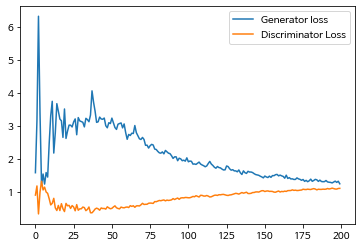

In [34]:
plt.figure()
losses_g = [fl.item() for fl in losses_g ]
plt.plot(losses_g, label='Generator loss')
losses_d = [f2.item() for f2 in losses_d ]
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()

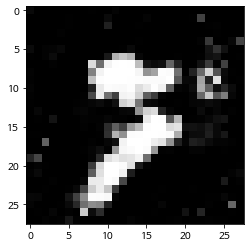

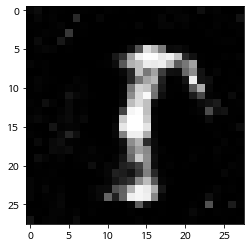

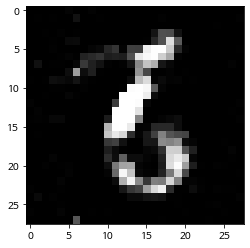

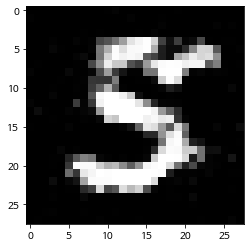

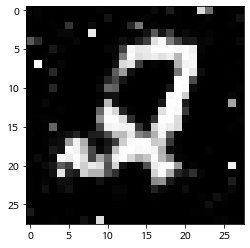

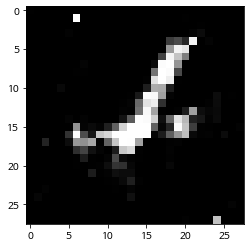

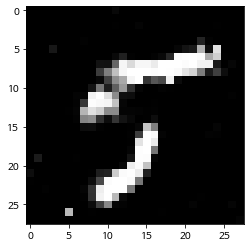

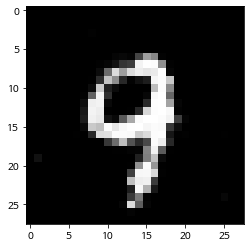

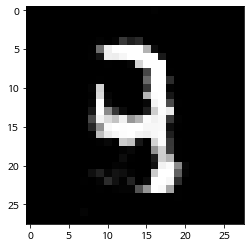

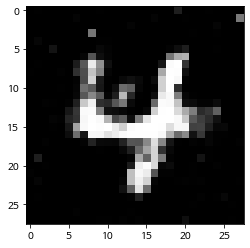

In [35]:
fake_images = generator(torch.randn(b_size, nz).to(device))
for i in range(10):
    fake_images_img = np.reshape(fake_images.data.cpu().numpy()[i],(28, 28))
    plt.imshow(fake_images_img, cmap = 'gray')    
    plt.show()